EDA

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import sklearn

In [2]:
data = pd.read_csv('online_shoppers_intention.csv')
data

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,False,False


In [3]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(data["VisitorType"])
le.classes_

array(['New_Visitor', 'Other', 'Returning_Visitor'], dtype=object)

In [4]:
data["VisitorType"] = le.transform(data["VisitorType"])

In [5]:
le.fit(data["Weekend"])
data["Weekend"] = le.transform(data["Weekend"])

le.fit(data["Revenue"])
data["Revenue"] = le.transform(data["Revenue"])

In [6]:
data["Month"].value_counts()
new_nums = {"Month":     {"May": 5, "Nov": 11, "Mar": 3, "Dec": 12, "Oct": 10, "Sep": 9, "Aug": 8, "Jul": 7, "June": 6, "Feb": 2}}
data = data.replace(new_nums)
data

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,2,1,1,1,1,2,0,0
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,2,2,2,1,2,2,0,0
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,2,4,1,9,3,2,0,0
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,2,3,2,2,4,2,0,0
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,2,3,3,1,4,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,12,4,6,1,1,2,1,0
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,11,3,2,1,8,2,1,0
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,11,3,2,1,13,2,1,0
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,11,2,2,3,11,2,0,0


In [7]:
def encode(data, col, max_val):
    data[col + '_sin'] = np.sin(2 * np.pi * data[col]/max_val)
    data[col + '_cos'] = np.cos(2 * np.pi * data[col]/max_val)
    return data

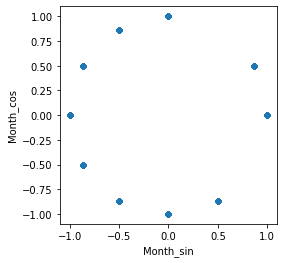

In [8]:
data = encode(data, 'Month', 12)
ax = data.plot.scatter('Month_sin', 'Month_cos').set_aspect('equal')

In [165]:
data[['Month','Month_sin', 'Month_cos']]

,Month,Month_sin,Month_cos
0,2,8.660254e-01,0.500000
1,2,8.660254e-01,0.500000
2,2,8.660254e-01,0.500000
3,2,8.660254e-01,0.500000
4,2,8.660254e-01,0.500000
...,...,...,...
12325,12,-2.449294e-16,1.000000
12326,11,-5.000000e-01,0.866025
12327,11,-5.000000e-01,0.866025
12328,11,-5.000000e-01,0.866025


In [175]:
l=[2,6,7,8,9,10,12,3,11,5]
for i in l:
    print(i)
    print(np.sin(2 * np.pi * i/12))
    print("---")

2
0.8660254037844386
---
6
1.2246467991473532e-16
---
7
-0.4999999999999998
---
8
-0.8660254037844384
---
9
-1.0
---
10
-0.8660254037844386
---
12
-2.4492935982947064e-16
---
3
1.0
---
11
-0.5000000000000004
---
5
0.49999999999999994
---


In [9]:
print(len(data))
data.isnull().sum()

12330


Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
Month_sin                  0
Month_cos                  0
dtype: int64

In [10]:
include='all'
data.describe(include=include)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Month_sin,Month_cos
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,1.233000e+04,1.233000e+04
mean,2.315166,80.818611,0.503569,34.472398,31.731468,1194.746220,0.022191,0.043073,5.889258,0.061427,7.651987,2.124006,2.357097,3.147364,4.069586,1.718329,0.232603,0.154745,5.960355e-02,7.282334e-02
std,3.321784,176.779107,1.270156,140.749294,44.475503,1913.669288,0.048488,0.048597,18.568437,0.198917,3.392841,0.911325,1.717277,2.401591,4.025169,0.690759,0.422509,0.361676,6.294086e-01,7.714074e-01
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,-1.000000e+00,-1.000000e+00
25%,0.000000,0.000000,0.000000,0.000000,7.000000,184.137500,0.000000,0.014286,0.000000,0.000000,5.000000,2.000000,2.000000,1.000000,2.000000,2.000000,0.000000,0.000000,-5.000000e-01,-8.660254e-01
50%,1.000000,7.500000,0.000000,0.000000,18.000000,598.936905,0.003112,0.025156,0.000000,0.000000,7.000000,2.000000,2.000000,3.000000,2.000000,2.000000,0.000000,0.000000,-2.449294e-16,6.123234e-17
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1464.157214,0.016813,0.050000,0.000000,0.000000,11.000000,3.000000,2.000000,4.000000,4.000000,2.000000,0.000000,0.000000,5.000000e-01,8.660254e-01
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,12.000000,8.000000,13.000000,9.000000,20.000000,2.000000,1.000000,1.000000,1.000000e+00,1.000000e+00


In [11]:
data.dtypes

Administrative               int64
Administrative_Duration    float64
Informational                int64
Informational_Duration     float64
ProductRelated               int64
ProductRelated_Duration    float64
BounceRates                float64
ExitRates                  float64
PageValues                 float64
SpecialDay                 float64
Month                        int64
OperatingSystems             int64
Browser                      int64
Region                       int64
TrafficType                  int64
VisitorType                  int64
Weekend                      int64
Revenue                      int64
Month_sin                  float64
Month_cos                  float64
dtype: object

In [12]:
import pandas_profiling
import pandas as pd
pd.read_csv('online_shoppers_intention.csv').profile_report()

Summarize dataset:   0%|          | 0/31 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [86]:
x = data[["Administrative","Administrative_Duration","Informational","Informational_Duration","ProductRelated","ProductRelated_Duration","BounceRates","ExitRates","PageValues","SpecialDay","Month_sin", "Month_cos","OperatingSystems","Browser","Region","TrafficType","VisitorType","Weekend"]]
y=data["Revenue"]

In [87]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, train_size=0.8, random_state=101)

In [88]:
print(X_train.shape[0]/x.shape[0], X_test.shape[0]/x.shape[0])

0.8 0.2


In [89]:
y_test.describe()

count    2466.000000
mean        0.152068
std         0.359160
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: Revenue, dtype: float64

KNN: lazy learner

In [90]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
#scale data
X_train2 = scaler.transform(X_train)
X_test2 = scaler.transform(X_test)

In [178]:
pd.DataFrame(X_train2).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
count,9.864000e+03,9.864000e+03,9.864000e+03,9.864000e+03,9.864000e+03,9.864000e+03,9.864000e+03,9.864000e+03,9.864000e+03,9.864000e+03,9.864000e+03,9.864000e+03,9.864000e+03,9.864000e+03,9.864000e+03,9.864000e+03,9.864000e+03,9.864000e+03
mean,5.459159e-16,-2.890530e-16,5.452068e-17,-1.679437e-15,1.324074e-16,-4.920818e-17,2.216394e-16,1.186815e-16,1.177642e-16,8.230440e-16,-2.383423e-16,-1.589558e-16,-4.705898e-16,4.721374e-16,5.574357e-16,-1.624140e-16,1.796346e-16,-5.809312e-16
std,1.000051e+00,1.000051e+00,1.000051e+00,1.000051e+00,1.000051e+00,1.000051e+00,1.000051e+00,1.000051e+00,1.000051e+00,1.000051e+00,1.000051e+00,1.000051e+00,1.000051e+00,1.000051e+00,1.000051e+00,1.000051e+00,1.000051e+00,1.000051e+00
min,-6.986401e-01,-4.552338e-01,-3.958340e-01,-2.469676e-01,-7.166106e-01,-6.181613e-01,-4.588140e-01,-8.874764e-01,-3.099364e-01,-3.084634e-01,-1.683537e+00,-1.389725e+00,-1.239469e+00,-7.933279e-01,-8.929125e-01,-7.584841e-01,-2.495038e+00,-5.511145e-01
25%,-6.986401e-01,-4.552338e-01,-3.958340e-01,-2.469676e-01,-5.579302e-01,-5.229707e-01,-4.588140e-01,-5.933582e-01,-3.099364e-01,-3.084634e-01,-8.885035e-01,-1.216148e+00,-1.402941e-01,-2.067612e-01,-8.929125e-01,-5.114822e-01,4.063537e-01,-5.511145e-01
50%,-3.961874e-01,-4.099973e-01,-3.958340e-01,-2.469676e-01,-3.085752e-01,-3.065879e-01,-3.946880e-01,-3.654344e-01,-3.099364e-01,-3.084634e-01,-9.346993e-02,-9.412847e-02,-1.402941e-01,-2.067612e-01,-6.446037e-02,-5.114822e-01,4.063537e-01,-5.511145e-01
75%,5.111709e-01,6.705345e-02,-3.958340e-01,-2.469676e-01,1.447975e-01,1.441181e-01,-1.111360e-01,1.419372e-01,-3.099364e-01,-3.084634e-01,7.015636e-01,1.027891e+00,9.588810e-01,-2.067612e-01,3.497657e-01,-1.747844e-02,4.063537e-01,-5.511145e-01
max,7.467584e+00,1.876321e+01,1.830092e+01,1.778436e+01,1.526478e+01,3.267579e+01,3.669137e+00,3.230178e+00,1.882202e+01,4.732430e+00,1.496597e+00,1.201468e+00,6.454756e+00,6.245472e+00,2.420896e+00,3.934552e+00,4.063537e-01,1.814505e+00


In [91]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

params = {'n_neighbors':[3,5,11,19], 
          'weights': ['uniform', 'distance'],
         'metric': ['euclidean', 'manhattan', 'minkowski', 'chebyshev']}
search=GridSearchCV(KNeighborsClassifier(),
               params,
               verbose=1,
               cv=3,
               n_jobs=-1)
results=search.fit(X_train2, y_train)


Fitting 3 folds for each of 32 candidates, totalling 96 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   17.7s
[Parallel(n_jobs=-1)]: Done  96 out of  96 | elapsed:   30.3s finished


In [92]:
print("score:" , results.best_score_,"\n" ,"estimator:", results.best_estimator_,"\n" ,"results:", results.best_params_)


score: 0.8757096512570964 
 estimator: KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='chebyshev',
                     metric_params=None, n_jobs=None, n_neighbors=19, p=2,
                     weights='uniform') 
 results: {'metric': 'chebyshev', 'n_neighbors': 19, 'weights': 'uniform'}


In [93]:
best = KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='chebyshev',
                     metric_params=None, n_jobs=None, n_neighbors=19, p=2,
                     weights='uniform')
best.fit(X_train2, y_train)
y_pred = best.predict(X_test2)
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.98      0.93      2091
           1       0.73      0.36      0.48       375

    accuracy                           0.88      2466
   macro avg       0.81      0.67      0.71      2466
weighted avg       0.87      0.88      0.87      2466



MLP: eager learner

In [115]:
from sklearn.neural_network import MLPClassifier
mlp = MLPClassifier(max_iter=100)
params2 = {
    'hidden_layer_sizes': [(17),(17,17),(17,17,17)], #single hidden layer
    #3 layers of 17 neurons for the 17 features
    #number of neurons you want at each layer, where the nth entry in the tuple represents the number of neurons in the nth layer of the MLP model
    'activation': ['tanh', 'relu','logistic'],
    'solver': ['sgd', 'adam','lbfgs'],
    'alpha': [0.0001,0.001,0.01, 0.05,0.5],
    'learning_rate': ['constant','adaptive','invscaling']}
from sklearn.model_selection import GridSearchCV
search2 = GridSearchCV(mlp, params2, n_jobs=-1, cv=3)
results2=search2.fit(X_train, y_train) 

In [116]:
print("score:" , results2.best_score_,"\n" ,"estimator:", results2.best_estimator_,"\n" ,"results:", results2.best_params_)

score: 0.8949716139497162 
 estimator: MLPClassifier(activation='logistic', alpha=0.01, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=17, learning_rate='invscaling',
              learning_rate_init=0.001, max_fun=15000, max_iter=100,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=None, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False) 
 results: {'activation': 'logistic', 'alpha': 0.01, 'hidden_layer_sizes': 17, 'learning_rate': 'invscaling', 'solver': 'adam'}


In [117]:
best2 = MLPClassifier(activation='logistic', alpha=0.01, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=17, learning_rate='invscaling',
              learning_rate_init=0.001, max_fun=15000, max_iter=100,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=None, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False) 
best2.fit(X_train, y_train)
y_pred2 = best2.predict(X_test)
print(classification_report(y_test, y_pred2))

              precision    recall  f1-score   support

           0       0.91      0.96      0.94      2091
           1       0.70      0.49      0.57       375

    accuracy                           0.89      2466
   macro avg       0.81      0.73      0.76      2466
weighted avg       0.88      0.89      0.88      2466



Random Forrest: interpretable

In [97]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(random_state=101)
params3 = { 
    'n_estimators': [100, 200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']}
search3 = GridSearchCV(estimator=rf, param_grid=params3,n_jobs=-1, cv= 3)
results3 = search3.fit(X_train, y_train)

In [98]:
print("score:" , results3.best_score_,"\n" ,"estimator:", results3.best_estimator_,"\n" ,"results:", results3.best_params_)


score: 0.9032846715328468 
 estimator: RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=7, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=101,
                       verbose=0, warm_start=False) 
 results: {'criterion': 'entropy', 'max_depth': 7, 'max_features': 'auto', 'n_estimators': 100}


In [99]:
best3 = RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=7, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=101,
                       verbose=0, warm_start=False)
best3.fit(X_train, y_train)
y_pred3 = best3.predict(X_test)
print(classification_report(y_test, y_pred3))

              precision    recall  f1-score   support

           0       0.92      0.97      0.95      2091
           1       0.78      0.56      0.65       375

    accuracy                           0.91      2466
   macro avg       0.85      0.77      0.80      2466
weighted avg       0.90      0.91      0.90      2466



Logistic Regression: linear classifier

In [100]:
from sklearn.linear_model import LogisticRegression
logreg=LogisticRegression()
params4={
    "C":np.logspace(-3,3,7), 
    "penalty":["l1"],
    "solver":['liblinear']} #'liblinear’ is limited to one-versus-rest schemes
search4=GridSearchCV(logreg,params4,cv=3)
results4=search4.fit(X_train,y_train)

In [101]:
print("score:" , results4.best_score_,"\n" ,"estimator:", results4.best_estimator_,"\n" ,"results:", results4.best_params_)


score: 0.8835158150851581 
 estimator: LogisticRegression(C=0.01, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l1',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False) 
 results: {'C': 0.01, 'penalty': 'l1', 'solver': 'liblinear'}


In [102]:
best4 = LogisticRegression(C=0.01, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l1',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)
best4.fit(X_train, y_train)
y_pred4 = best4.predict(X_test)
print(classification_report(y_test, y_pred4))

              precision    recall  f1-score   support

           0       0.90      0.97      0.94      2091
           1       0.73      0.39      0.51       375

    accuracy                           0.89      2466
   macro avg       0.81      0.68      0.72      2466
weighted avg       0.87      0.89      0.87      2466



Text(0, 0.5, 'Scores')

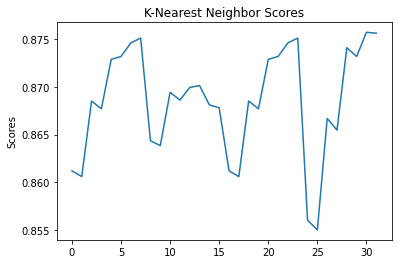

In [146]:
#check the other performances of other hyperparameters
#distribution of scores, standard deviation of scores
#how reliable is each model compared to their peak
#graphs ofdistribution of model
sns.lineplot(data=search.cv_results_['mean_test_score']).set(title='K-Nearest Neighbor Scores')
plt.ylabel('Scores', fontsize=10)

In [152]:
np.std(search.cv_results_['mean_test_score'])

0.005660496430129159

Text(0, 0.5, 'Scores')

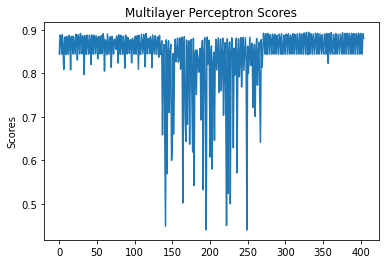

In [147]:
sns.lineplot(data=search2.cv_results_['mean_test_score']).set(title='Multilayer Perceptron Scores')
plt.ylabel('Scores', fontsize=10)

In [153]:
np.std(search2.cv_results_['mean_test_score'])

0.07835811309960651

Text(0, 0.5, 'Scores')

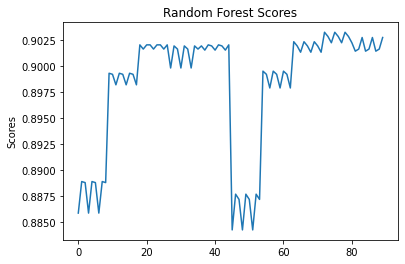

In [148]:
sns.lineplot(data=search3.cv_results_['mean_test_score']).set(title='Random Forest Scores')
plt.ylabel('Scores', fontsize=10)

In [154]:
np.std(search3.cv_results_['mean_test_score'])

0.0058335071307194526

Text(0, 0.5, 'Scores')

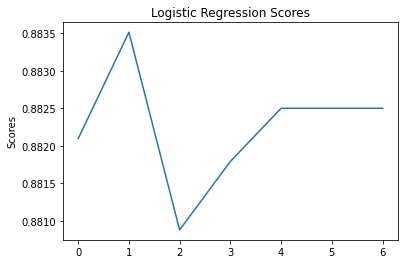

In [149]:
sns.lineplot(data=search4.cv_results_['mean_test_score']).set(title='Logistic Regression Scores')
plt.ylabel('Scores', fontsize=10)

In [155]:
np.std(search4.cv_results_['mean_test_score'])

0.0007466660152155226

Feature Importance

In [156]:
model = RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=7, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=101,
                       verbose=0, warm_start=False) 
model.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=7, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=101,
                       verbose=0, warm_start=False)

In [157]:
def plot_feature_importance(importance,names,model_type):

    #Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)

    #Create a DataFrame using a Dictionary
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)

    #Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

    #Define size of bar plot
    plt.figure(figsize=(10,8))
    #Plot Searborn bar chart
    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
    #Add chart labels
    plt.title(model_type + ' FEATURE IMPORTANCE')
    plt.xlabel('FEATURE IMPORTANCE')
    plt.ylabel('FEATURE NAMES')

In [158]:
X=['Administrative', 'Administrative Duration', 'Informational',
       'Informational Duration', 'Product Related', 'Product Related Duration',
       'Bounce Rates', 'Exit Rates', 'Page Values', 'Special Day', 'Month sin',
       'Month cos', 'Operating Systems', 'Browser', 'Region', 'Traffic Type',
       'Visitor Type', 'Weekend']

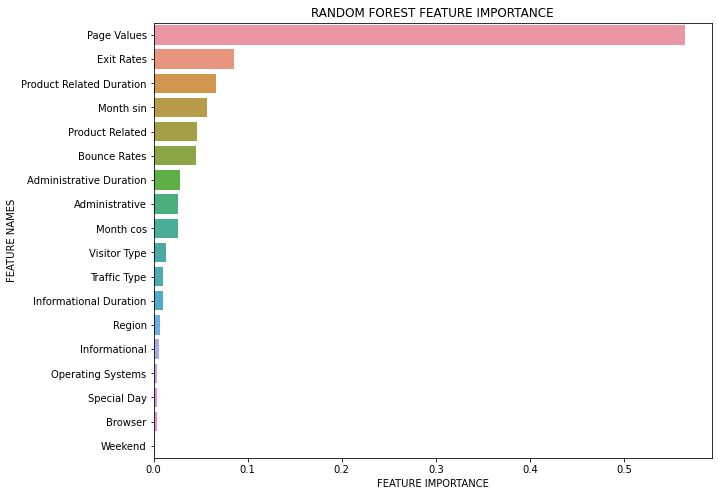

In [159]:
plot_feature_importance(model.feature_importances_,X,'RANDOM FOREST')
#seasonality of month sin and month cos

In [160]:
from sklearn.metrics import confusion_matrix
y_predm = model.predict(X_test)
CM = confusion_matrix(y_test, y_predm)
TN = CM[0][0]
FN = CM[1][0]
TP = CM[1][1]
FP = CM[0][1]
print("true negative:", TN,",", "false negative:", FN,",", "true positive:", TP,",", "false positive:", FP,",", "total:", TN+FN+TP+FP)

true negative: 2033 , false negative: 165 , true positive: 210 , false positive: 58 , total: 2466


In [7]:
import pandas as pd
data = {'Model':  ['K-Nearest Neighbor','Multilayer Perceptron', 'Random Forest', 'Logistic Regression'],
        'F1 Score': [0.87,.88, 0.90, 0.87],
        'Std Dev of Grid Search Scores': [0.0057,0.0784, 0.0058, 0.0007]
        }
pd.DataFrame(data)

,Model,F1 Score,Std Dev of Grid Search Scores
0,K-Nearest Neighbor,0.87,0.0057
1,Multilayer Perceptron,0.88,0.0784
2,Random Forest,0.90,0.0058
3,Logistic Regression,0.87,0.0007
